# Image Captioning System



In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline
import string
import os
import glob
import seaborn as sns
import time
import tensorflow as tf

from tqdm import tqdm
from PIL import Image, ImageFont, ImageDraw
from time import time
from functools import reduce
from collections import Counter
from IPython.display import display
from pickle import dump, load
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from nltk.corpus import stopwords
from nltk.translate.bleu_score import sentence_bleu

from keras.preprocessing import image as keras_image
from keras.preprocessing import sequence
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from keras.layers import LSTM, Embedding, Dense, Activation, Flatten, Reshape, Dropout, Bidirectional, add
from keras.applications.inception_v3 import preprocess_input, InceptionV3
from keras.models import Sequential, Model
from keras.utils import to_categorical
from keras.optimizers import Adam, RMSprop
from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Dense, Dropout, Embedding, LSTM, BatchNormalization, LeakyReLU, Bidirectional, Concatenate, TimeDistributed, RepeatVector, \
    Activation, Flatten, Reshape, concatenate, Dropout, Conv2D
from tensorflow.keras.regularizers import L1L2

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# Data Preparation

In [2]:
token_path = "../input/flickr8k-text/flickr8k.token.txt"
train_images_path = '../input/flickr8k-text/flickr_8k.trainImages.txt'
test_images_path = '../input/flickr8k-text/flickr_8k.testImages.txt'
images_path = '../input/flickr-8k-images-with-captions/Images/'
glove_path = '../input/glove-global-vectors-for-word-representation/'

doc = open(token_path,'r').read()

In [3]:
images='../input/flickr8k/Images'

all_imgs = glob.glob(images + '/*.jpg',recursive=True)
print("The total images present in the dataset: {}".format(len(all_imgs))) #

The total images present in the dataset: 8091


In [4]:
def load_doc(filename):
    
    text=open(filename).read()
    
    return text

def get_img_ids_and_captions(text):
    keys=[]
    values=[]
    key_paths=[]
    text=text.splitlines()[1:]
    for line in text:
        com_idx=line.index(",")
        im_id,im_cap=line[:com_idx],line[com_idx+1:]
        keys.append(im_id)
        values.append(im_cap)
        key_paths.append(images+'/'+im_id)
    return keys,values,key_paths

text_file="/kaggle/input/flickr-8k-images-with-captions/captions.txt"
doc = load_doc(text_file)
print(doc[:300])

image,caption
1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg,A girl going into a wooden building .
1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg,A little girl climbing


In [5]:
all_img_id,annotations,all_img_vector= get_img_ids_and_captions(doc)
df = pd.DataFrame(list(zip(all_img_id, all_img_vector,annotations)),columns =['ID','Path', 'Captions'])     
df #

,ID,Path,Captions
0,1000268201_693b08cb0e.jpg,../input/flickr8k/Images/1000268201_693b08cb0e...,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,../input/flickr8k/Images/1000268201_693b08cb0e...,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,../input/flickr8k/Images/1000268201_693b08cb0e...,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,../input/flickr8k/Images/1000268201_693b08cb0e...,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,../input/flickr8k/Images/1000268201_693b08cb0e...,A little girl in a pink dress going into a woo...
...,...,...,...
40450,997722733_0cb5439472.jpg,../input/flickr8k/Images/997722733_0cb5439472.jpg,A man in a pink shirt climbs a rock face
40451,997722733_0cb5439472.jpg,../input/flickr8k/Images/997722733_0cb5439472.jpg,A man is rock climbing high in the air .
40452,997722733_0cb5439472.jpg,../input/flickr8k/Images/997722733_0cb5439472.jpg,A person in a red shirt climbing up a rock fac...
40453,997722733_0cb5439472.jpg,../input/flickr8k/Images/997722733_0cb5439472.jpg,A rock climber in a red shirt .


# Caption Processing

In [6]:
descriptions = dict()
for line in doc.split('\n'):
        tokens = line.split()
        if len(line) > 2:
          image_id = tokens[0].split('.')[0]
          image_desc = ' '.join(tokens[1:])
          if image_id not in descriptions:
              descriptions[image_id] = list()
          descriptions[image_id].append(image_desc)
        
print(f'Total images: {len(descriptions)}')

Total images: 8092


In [7]:
annotations=df.Captions.apply(lambda z:"<start>"+" "+z+" "+"<end>")
all_img_path=df.Path.to_list()#

### Tokenization

In [8]:
top_word_cnt = 5000
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_word_cnt,oov_token="<unk>",filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
tokenizer.fit_on_texts(annotations)
train_seqs = tokenizer.texts_to_sequences(annotations)

In [9]:
def min_max_for_nested_array(nested_array):
    array=[len(e) for e in nested_array]
    return min(array),max(array)
min_l,max_l=min_max_for_nested_array(train_seqs)

# Text Normalization for Image Captions

In [10]:
table = str.maketrans('', '', string.punctuation)
for key, desc_list in descriptions.items():
    for i in range(len(desc_list)):
        desc = desc_list[i]
        desc = desc.split()
        desc = [word.lower() for word in desc]
        desc = [w.translate(table) for w in desc]
        desc_list[i] =  ' '.join(desc)

In [11]:
lines = list()
for key, desc_list in descriptions.items():
    for desc in desc_list:
        lines.append(key + ' ' + desc)
new_descriptions = '\n'.join(lines)

# Vocabulary Creation from Normalized Captions

In [12]:
vocabulary = set()
for key in descriptions.keys():
        [vocabulary.update(d.split()) for d in descriptions[key]]
print('Original Vocabulary Size: %d' % len(vocabulary))

Original Vocabulary Size: 8745


In [13]:
doc = open(train_images_path,'r').read()
dataset = list()
for line in doc.split('\n'):
    if len(line) > 1:
      identifier = line.split('.')[0]
      dataset.append(identifier)

train = set(dataset)

In [14]:
def voc_fetcher(frame,column):
    out=[]
    for i in frame[column]:
        out+=i.split(" ")
    return out


vocabulary=voc_fetcher(df,"Captions")
val_count=Counter(vocabulary)
val_count

Counter({'a': 40271,
         '.': 34212,
         'A': 21481,
         'in': 18961,
         'the': 15328,
         'on': 10729,
         'is': 9345,
         'and': 8850,
         'dog': 7982,
         'with': 7760,
         'man': 6828,
         'of': 6712,
         'Two': 3962,
         'white': 3875,
         'black': 3696,
         'are': 3503,
         'boy': 3442,
         'woman': 3227,
         'girl': 3217,
         ',': 3210,
         'to': 3173,
         'wearing': 3061,
         'The': 2920,
         'at': 2904,
         'water': 2774,
         'red': 2660,
         'brown': 2475,
         'people': 2442,
         'young': 2431,
         '."': 2365,
         'his': 2357,
         'blue': 2257,
         'dogs': 2082,
         'running': 2072,
         'through': 2031,
         'playing': 2008,
         'while': 1957,
         'an': 1944,
         'down': 1823,
         'shirt': 1803,
         'standing': 1786,
         'ball': 1778,
         'little': 1625,
         'grass

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


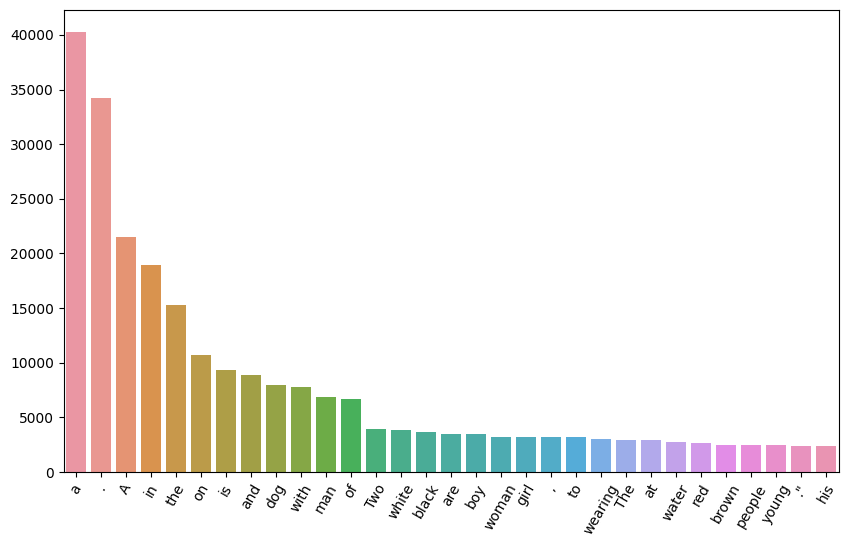

In [15]:
def get_top_words_based_on_cnt(words_dict,n_words):
    n_words+=1
    keys=list(words_dict.keys())
    values=list(words_dict.values())
    sorted_values=sorted(values,reverse=True)[:n_words]
    sorted_keys=[]
    for i in sorted_values:
        if sorted_values.count(i)==1:
            sorted_keys.append(keys[values.index(i)])
        elif sorted_values.count(i)==2:
            f_idx=values.index(i)
            s_idx=values[f_idx+1:].index(i)
            s_idx+=f_idx+1
            a,b=keys[f_idx],keys[s_idx]
            if a not in sorted_keys and b not in sorted_keys:
                sorted_keys.append(a)
                sorted_keys.append(b)
    plt.figure(figsize=(10,6))
    sns.barplot(x=sorted_keys,y=sorted_values)
    plt.xticks(rotation=60)
    plt.show()
    #write your code here
get_top_words_based_on_cnt(val_count,30)

# Image Data Preparation

In [16]:
img = glob.glob(images_path + '*.jpg')
train_images = set(open(train_images_path, 'r').read().strip().split('\n'))
train_img = []
for i in img: 
    if i[len(images_path):] in train_images:
        train_img.append(i)

test_images = set(open(test_images_path, 'r').read().strip().split('\n'))
test_img = []
for i in img: 
    if i[len(images_path):] in test_images: 
        test_img.append(i)

In [19]:
image_train, image_test, caption_train, caption_test = train_test_split(all_img_vector,cap_vector,test_size=0.2,random_state=42)

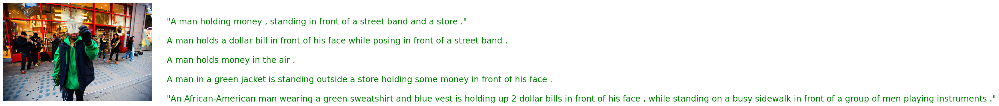

In [20]:
def caption_and_image_plotter(image_id,frame):
    #get captions
    caps=("\n"*2).join(frame[frame['ID']==image_id].Captions.to_list())
    fig, ax = plt.subplots()
    ax.set_axis_off()
    idx=df.ID.to_list().index(image_id)
    im=Image.open(df.Path.iloc[idx])
    w,h=im.size[0],im.size[-1]
    ax.imshow(im)
    ax.text(w+50,h,caps,fontsize=20,color='green')
caption_and_image_plotter(df.ID.iloc[8049],df)

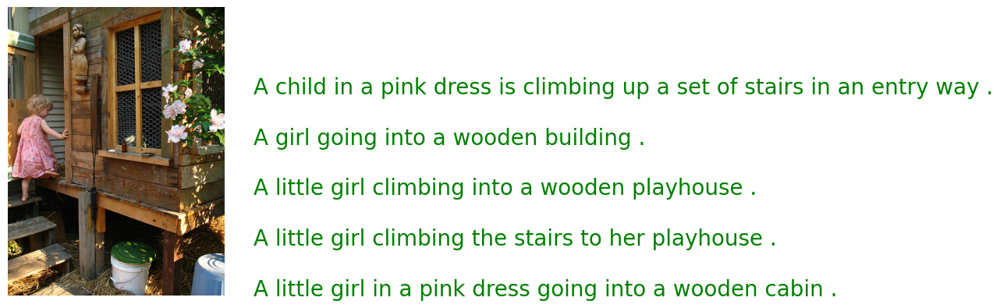

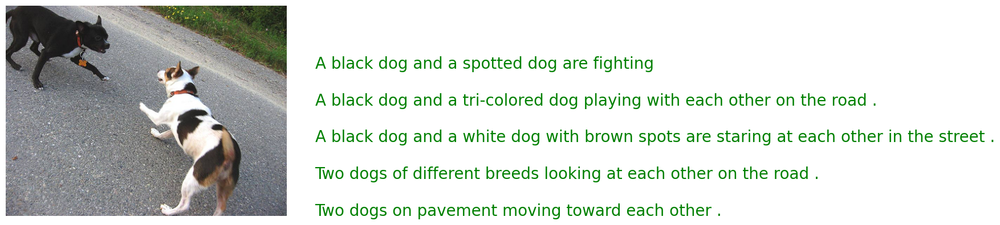

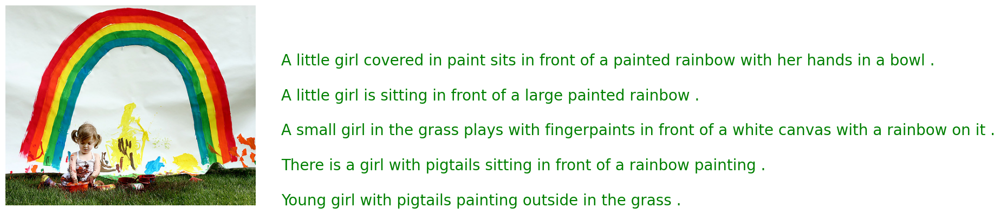

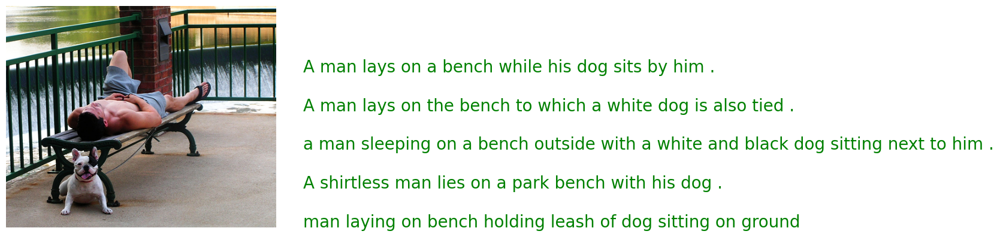

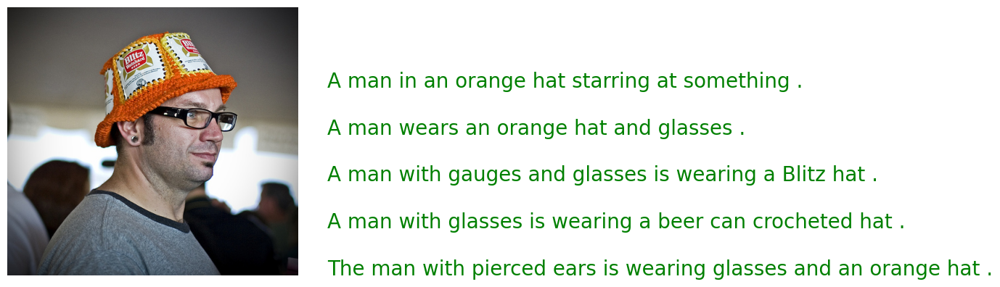

In [50]:
def run_caption_and_image_plotter_for_a_range(start,end,frame):
    for i in range(start,end):
        caption_and_image_plotter(frame.ID.drop_duplicates().iloc[i],frame)
run_caption_and_image_plotter_for_a_range(0,5,df)

In [21]:
BATCH_SIZE = 32
BUFFER_SIZE = 1000
def generate_dataset(images_data, captions_data):
    
    dataset = tf.data.Dataset.from_tensor_slices((images_data, captions_data))
    dataset = dataset.shuffle(BUFFER_SIZE)

    dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_function, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(BATCH_SIZE)


    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

# Preparing Image Captions for Training

In [22]:
train_descriptions = dict()
for line in new_descriptions.split('\n'):
    tokens = line.split()
    image_id, image_desc = tokens[0], tokens[1:]
    if image_id in train:
        if image_id not in train_descriptions:
            train_descriptions[image_id] = list()
        desc = 'startseq ' + ' '.join(image_desc) + ' endseq'
        train_descriptions[image_id].append(desc)

# Compiling All Training Captions

In [23]:
all_train_captions = []
for key, val in train_descriptions.items():
    for cap in val:
        all_train_captions.append(cap)

# Establishing the Effective Vocabulary

In [24]:
word_count_threshold = 10
word_counts = {}
nsents = 0
for sent in all_train_captions:
    nsents += 1
    for w in sent.split(' '):
        word_counts[w] = word_counts.get(w, 0) + 1
vocab = [w for w in word_counts if word_counts[w] >= word_count_threshold]

print('Vocabulary = %d' % (len(vocab)))

Vocabulary = 1638


# Creating Word-to-Index and Index-to-Word Mapping

In [25]:
ixtoword = {}
wordtoix = {}
ix = 1
for w in vocab:
    wordtoix[w] = ix
    ixtoword[ix] = w
    ix += 1

vocab_size = len(ixtoword) + 1 

In [26]:
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'
train_seqs = tokenizer.texts_to_sequences(annotations)

In [27]:
cap_vector=tf.keras.preprocessing.sequence.pad_sequences(train_seqs,padding='post',maxlen=max_l)

# Determining Maximum Description Length

In [28]:
all_desc = list()
for key in train_descriptions.keys():
    [all_desc.append(d) for d in train_descriptions[key]]
lines = all_desc
max_length = max(len(d.split()) for d in lines)

print('Description Length: %d' % max_length)

Description Length: 37


# GloVe Embeddings for Word Representation

In [29]:
embeddings_index = {} 
f = open(os.path.join(glove_path, 'glove.6B.200d.txt'), encoding="utf-8")
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs

# Creating the Embedding Matrix

In [30]:
embedding_dim = len(list(embeddings_index.values())[0])
embedding_matrix = np.zeros((vocab_size, embedding_dim))
for word, i in wordtoix.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

# Utilizing Transfer Learning with InceptionV3

In [31]:
cnn = InceptionV3(weights='imagenet')
cnn_wo_softmax = Model(cnn.input, cnn.layers[-2].output)

96112376/96112376 [==============================] - 1s 0us/step


In [79]:
image_model = tf.keras.applications.InceptionV3(include_top=False,weights='imagenet')

new_input = image_model.input #write code here to get the input of the image_model
hidden_layer = image_model.layers[-1].output #write code here to get the output of the image_model

image_features_extract_model = tf.keras.Model(new_input, hidden_layer) #build the final model using both input & output layer

87910968/87910968 [==============================] - 0s 0us/step


# Image Preprocessing for InceptionV3

In [32]:
import keras
from keras.preprocessing.image import load_img, img_to_array
 
def preprocess(image_path):
    img =load_img(image_path, target_size=(299, 299))
    x = img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return x

In [33]:
feature_dict = {}
def map_function(image_name,capt):
    image_tensor = feature_dict[image_name.decode('utf-8')]
    return image_tensor,capt

In [49]:
def load_the_image(file_path):
    my_img = tf.io.read_file(file_path)
    my_img = tf.image.decode_jpeg(my_img, channels=3)
    my_img = tf.image.resize(my_img, (299, 299))
    my_img = tf.keras.applications.inception_v3.preprocess_input(my_img)
    return my_img,file_path

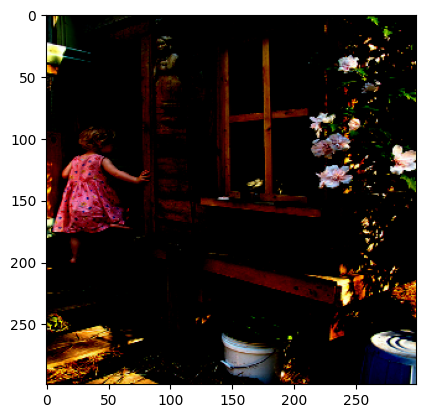

In [50]:
plt.imshow(load_the_image(all_img_path[0])[0])

In [51]:
encode_train_set = sorted(set(all_img_vector))

feature_dict = {}


image_data_set = tf.data.Dataset.from_tensor_slices(encode_train_set)
image_data_set = image_data_set.map(load_the_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(32)

# Image Encoding with InceptionV3

In [18]:
def encode(image):
    image = preprocess(image) 
    fea_vec = cnn_wo_softmax.predict(image) 
    fea_vec = np.reshape(fea_vec, fea_vec.shape[1])
    return fea_vec

encoding_train = {}
for img in train_img:
    encoding_train[img[len(images_path):]] = encode(img)
train_features = encoding_train

encoding_test = {}
for img in test_img:
    encoding_test[img[len(images_path):]] = encode(img)

1/1 [==============================] - 0s 24ms/step


# Model Architecture 

In [34]:
# Image features
inputs1 = Input(shape=(2048,))
fe1 = Dropout(0.5)(inputs1)
fe2 = Dense(2048, activation='relu')(fe1)
fe3 = BatchNormalization()(fe2)
fe4 = Dense(1024, activation='relu')(fe3)
fe5 = BatchNormalization()(fe4)
fe6 = Dense(512, activation='relu')(fe5)
fe7 = BatchNormalization()(fe6)
fe8 = Dense(256, activation='relu')(fe7)
fe9 = BatchNormalization()(fe8)

# Word sequences
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True)(inputs2)
se2 = Dropout(0.5)(se1)
se3 = Bidirectional(LSTM(512, return_sequences=True))(se2)
se4 = Bidirectional(LSTM(256))(se3)

# Merging RNN and CNN
decoder1 = Concatenate()([fe9, se4])

# decoder
decoder2 = Dense(1024, activation='relu')(decoder1)
decoder3 = BatchNormalization()(decoder2)
decoder4 = Dense(512, activation='relu')(decoder3)
decoder5 = BatchNormalization()(decoder4)
decoder6 = Dense(256, activation='relu')(decoder5)
decoder7 = BatchNormalization()(decoder6)

# Output layer
outputs = Dense(vocab_size, activation='softmax')(decoder7)

# Build
model = Model(inputs=[inputs1, inputs2], outputs=outputs)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy')

model.summary()


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 2048)]               0         []                            
                                                                                                  
 dropout (Dropout)           (None, 2048)                 0         ['input_2[0][0]']             
                                                                                                  
 dense (Dense)               (None, 2048)                 4196352   ['dropout[0][0]']             
                                                                                                  
 batch_normalization_94 (Ba  (None, 2048)                 8192      ['dense[0][0]']               
 tchNormalization)                                                                          

# Embedding Layer Configuration

In [35]:
for layer in model.layers:
    if isinstance(layer, Embedding):
        layer.set_weights([embedding_matrix])
        layer.trainable = False
        break

# Optimizer Configuration

In [36]:
epochs = 20
initial_learning_rate = 0.001

optimizer = Adam(lr=initial_learning_rate)

model.compile(loss='categorical_crossentropy', optimizer=optimizer)

# Data Generator for Training

In [38]:
import numpy as np

def data_generator(descriptions, photos, wordtoix, max_length, num_photos_per_batch):
    X1, X2, y = list(), list(), list()
    n=0
    while 1:
        for key, desc_list in descriptions.items():
            n+=1
            photo = photos[key+'.jpg']
            for desc in desc_list:
                seq = [wordtoix[word] for word in desc.split(' ') if word in wordtoix]
                for i in range(1, len(seq)):
                    in_seq, out_seq = seq[:i], seq[i]
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    X1.append(photo)
                    X2.append(in_seq)
                    y.append(out_seq)

            if n==num_photos_per_batch:
                yield ([np.array(X1), np.array(X2)], np.array(y))
                X1, X2, y = list(), list(), list()
                n=0

In [84]:
for image,path in tqdm(image_data_set):
    batch_features = image_features_extract_model(image)
    batch_features = tf.reshape(batch_features,(batch_features.shape[0], -1, batch_features.shape[3]))
    for batch_f, p in zip(batch_features, path):
        path_of_feature = p.numpy().decode("utf-8")
        feature_dict[path_of_feature] =  batch_f.numpy()

100%|██████████| 253/253 [01:06<00:00,  3.81it/s]


In [86]:
BATCH_SIZE = 32
BUFFER_SIZE = 1000
def generate_dataset(images_data, captions_data):
    
    dataset = tf.data.Dataset.from_tensor_slices((images_data, captions_data))
    dataset = dataset.shuffle(BUFFER_SIZE)

    dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_function, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(BATCH_SIZE)


    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return dataset

# Model Training

In [23]:
batch_size = 10
steps = len(train_descriptions)//batch_size

generator = data_generator(train_descriptions, train_features, wordtoix, max_length, batch_size)
model.fit(generator, epochs=epochs, steps_per_epoch=steps, verbose=1)

Epoch 1/20
600/600 [==============================] - 182s 267ms/step - loss: 4.0260
Epoch 2/20
600/600 [==============================] - 160s 268ms/step - loss: 3.2874
Epoch 3/20
600/600 [==============================] - 160s 266ms/step - loss: 3.0564
Epoch 4/20
600/600 [==============================] - 160s 267ms/step - loss: 2.9085
Epoch 5/20
600/600 [==============================] - 160s 266ms/step - loss: 2.7956
Epoch 6/20
600/600 [==============================] - 159s 266ms/step - loss: 2.7014
Epoch 7/20
600/600 [==============================] - 160s 266ms/step - loss: 2.6185
Epoch 8/20
600/600 [==============================] - 160s 266ms/step - loss: 2.5372
Epoch 9/20
600/600 [==============================] - 159s 266ms/step - loss: 2.4621
Epoch 10/20
600/600 [==============================] - 160s 266ms/step - loss: 2.3907
Epoch 11/20
600/600 [==============================] - 159s 265ms/step - loss: 2.3188
Epoch 12/20
600/600 [==============================] - 160s 266

# Beam Search for Caption Generation

In [39]:
def beam_search_predictions(image, beam_index = 3):
    start = [wordtoix["startseq"]]
    start_word = [[start, 0.0]]
    while len(start_word[0][0]) < max_length:
        temp = []
        for s in start_word:
            par_caps = pad_sequences([s[0]], maxlen=max_length, padding='post')
            preds = model.predict([image,par_caps], verbose=0)
            word_preds = np.argsort(preds[0])[-beam_index:]
            for w in word_preds:
                next_cap, prob = s[0][:], s[1]
                next_cap.append(w)
                prob += preds[0][w]
                temp.append([next_cap, prob])
                    
        start_word = temp
        start_word = sorted(start_word, reverse=False, key=lambda l: l[1])
        start_word = start_word[-beam_index:]
    
    start_word = start_word[-1][0]
    intermediate_caption = [ixtoword[i] for i in start_word]
    final_caption = []
    
    for i in intermediate_caption:
        if i != 'endseq':
            final_caption.append(i)
        else:
            break

    final_caption = ' '.join(final_caption[1:])
    return final_caption

# TEST

In [41]:
pic = '343218198_1ca90e0734.jpg'
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images_path+pic)
plt.imshow(x)
plt.axis('off')
plt.show()

print("Beam Search, K = 15:",beam_search_predictions(image, beam_index = 15))

NameError: name 'encoding_test' is not defined

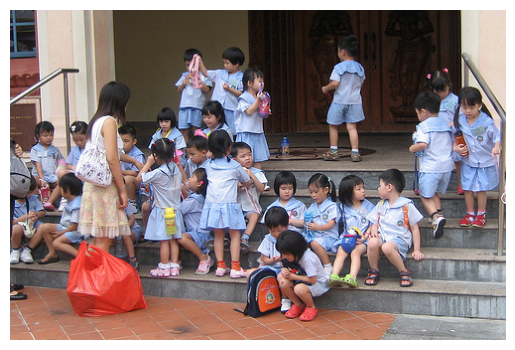

Beam Search, K = 15: a group of children playing on a


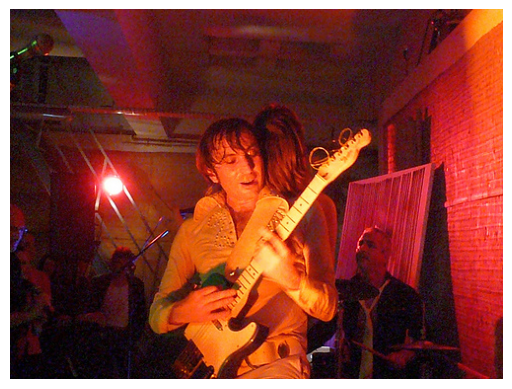

Beam Search, K = 15: a band performs


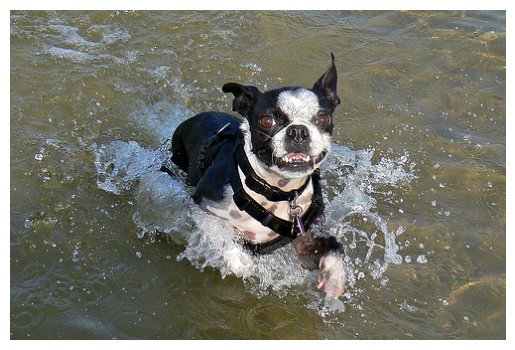

Beam Search, K = 15: there is a black and white dog splashes in the water


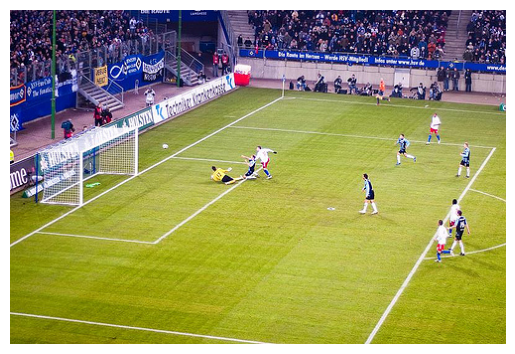

Beam Search, K = 15: black and white dog chasing a frisbee in the grass


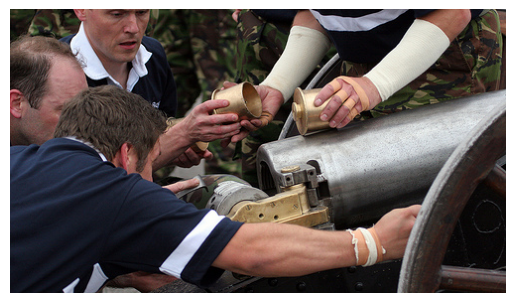

Beam Search, K = 15: there is a man in a white robe at a carnival


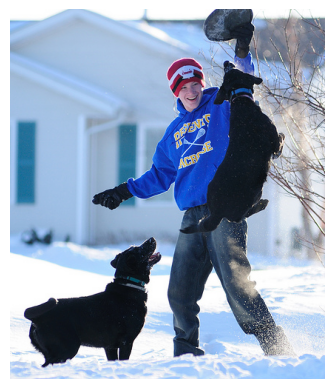

Beam Search, K = 15: a closeup of a big black dog in the snow


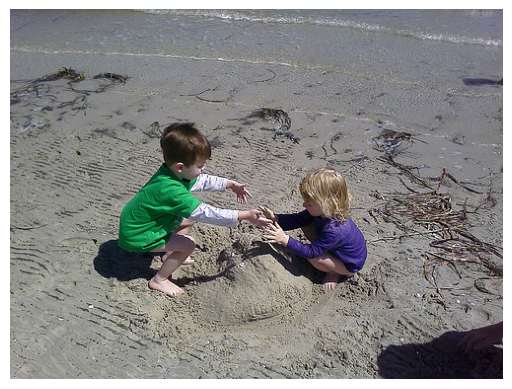

Beam Search, K = 15: there is a man at the edge of a dock next to a lake


In [26]:
for pic in list(encoding_test.keys())[18:25]:
    image = encoding_test[pic].reshape((1,2048))
    x=plt.imread(images_path+pic)
    plt.imshow(x)
    plt.axis('off')
    plt.show()

    print("Beam Search, K = 15:",beam_search_predictions(image, beam_index = 15))

Model Enhancement

In [69]:
embedding_dim = 256 
units = 512
vocab_size = 5001 #top 5,000 words +1
train_num_steps = len(image_train) // BATCH_SIZE
test_num_steps = len(image_test) // BATCH_SIZE

Encoder

In [70]:
class Encoder(Model):
    def __init__(self,embed_dim):
        super(Encoder, self).__init__()
        self.fc = layers.Dense(embed_dim)
        self.dropout = layers.Dropout(0.5)
        
    def call(self, features):
        features = self.fc(features)
        features = tf.nn.relu(features)
        return features

In [71]:
encoder=Encoder(embedding_dim)

Attention Model

In [72]:
class Attention_model(Model):
    def __init__(self, units):
        super(Attention_model, self).__init__()
        self.W1 = layers.Dense(units)
        self.W2 = layers.Dense(units)
        self.V = layers.Dense(1)
        self.units=units

    def call(self, features, hidden):
        hidden_with_time_axis =  tf.expand_dims(hidden, 1)
        score = tf.keras.activations.tanh(self.W1(features) + self.W2(hidden_with_time_axis))
        attention_weights = tf.keras.activations.softmax(self.V(score), axis=1)

        context_vector = attention_weights * features
        context_vector = tf.reduce_sum(context_vector, axis=1)
        

        return context_vector, attention_weights

In [73]:
class RNN_Decoder(Model):
    def __init__(self, embedding_dim, units, vocab_size):

        super(RNN_Decoder, self).__init__()
        self.units = units

        self.embedding = layers.Embedding(vocab_size, embedding_dim)
        self.gru = layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
        
        self.fc1 = layers.Dense(self.units)
        self.fc2 = layers.Dense(vocab_size)

        self.attention = Attention_model(self.units)

    def call(self, x, features, hidden):
    # defining attention as a separate model
        context_vector, attention_weights = self.attention(features, hidden)

    # x shape after passing through embedding == (batch_size, 1, embedding_dim)
        x = self.embedding(x)

    # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
        x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
        output, state = self.gru(x)

    # shape == (batch_size, max_length, hidden_size)
        x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
        x = tf.reshape(x, (-1, x.shape[2]))

    # output shape == (batch_size * max_length, vocab)
        x = self.fc2(x)

        return x, state, attention_weights

    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

Decoder

In [74]:
class Decoder(Model):
    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder, self).__init__()
        self.units=units
        self.attention = Attention_model(self.units)
        self.embed = layers.Embedding(vocab_size, embed_dim,mask_zero=False)
        self.gru = tf.keras.layers.GRU(self.units,return_sequences=True,return_state=True,recurrent_initializer='glorot_uniform')
        self.d1 = layers.Dense(self.units)
        self.d2 = layers.Dense(vocab_size)   
        self.dropout = Dropout(0.5)

    def call(self,x,features, hidden):
        context_vector, attention_weights = self.attention(features, hidden)
        embed = self.dropout(self.embed(x)) 
        mask = self.embed.compute_mask(x)
        embed =  tf.concat([tf.expand_dims(context_vector, 1), embed], axis=-1)
        output,state = self.gru(embed,mask=mask)
        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2])) 
        output = self.d2(output) 

        return output,state, attention_weights
    
    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [75]:
decoder=Decoder(embedding_dim, units, vocab_size)

In [87]:
sample_img_batch, sample_cap_batch = next(iter(train_dataset))
print(sample_img_batch.shape)  #(batch_size, 8*8, 2048)
print(sample_cap_batch.shape) #(batch_size,40)

(32, 64, 2048)
(32, 39)


In [88]:
features=encoder(sample_img_batch)

hidden = decoder.init_state(batch_size=sample_cap_batch.shape[0])
dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * sample_cap_batch.shape[0], 1)

predictions, hidden_out, attention_weights= decoder(dec_input, features, hidden)
print('Feature shape from Encoder: {}'.format(features.shape)) 
print('Predcitions shape from Decoder: {}'.format(predictions.shape)) 
print('Attention weights shape from Decoder: {}'.format(attention_weights.shape)) 

Feature shape from Encoder: (32, 64, 256)
Predcitions shape from Decoder: (32, 5001)
Attention weights shape from Decoder: (32, 64, 1)


In [43]:
train_dataset=generate_dataset(image_train,caption_train)
test_dataset=generate_dataset(image_test,caption_test)

In [60]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')

In [61]:
def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)
    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask
    return tf.reduce_mean(loss_)

In [89]:
checkpoint_path = "Flickr8K/File4/"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [90]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

In [64]:
@tf.function
def train_step(img_tensor, target):
    loss = 0
    hidden = decoder.init_state(batch_size=target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    with tf.GradientTape() as tape:
        features = encoder(img_tensor)
        for i in range(1, target.shape[1]):
            predictions, hidden, _ = decoder(dec_input, features, hidden)
            loss += loss_function(target[:, i], predictions)
            dec_input = tf.expand_dims(target[:, i], 1)
        avg_loss = (loss/int(target.shape[1]))
        trainable_variables = encoder.trainable_variables + decoder.trainable_variables
        gradients = tape.gradient(loss, trainable_variables)
        optimizer.apply_gradients(zip(gradients, trainable_variables))
        return loss, avg_loss

In [65]:
@tf.function
def test_step(img_tensor, target):
    loss = 0
    hidden = decoder.init_state(batch_size=target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

    with tf.GradientTape() as tape:
        features = encoder(img_tensor)

        for i in range(1, target.shape[1]):
            predictions, hidden, _ = decoder(dec_input, features, hidden)
            loss += loss_function(target[:, i], predictions)
            dec_input = tf.expand_dims(target[:, i], 1)

        avg_loss = (loss / int(target.shape[1]))

        trainable_variables = encoder.trainable_variables + decoder.trainable_variables
        gradients = tape.gradient(loss, trainable_variables)
        optimizer.apply_gradients(zip(gradients, trainable_variables))

        return loss, avg_loss

In [66]:
def test_loss_cal(test_dataset):
    total_loss = 0
    for (batch, (img_tensor, target)) in enumerate(test_dataset):
        batch_loss, t_loss = test_step(img_tensor, target)
        total_loss += t_loss
    avg_test_loss=total_loss/test_num_steps
    return avg_test_loss

In [67]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
            print('GPU IS UP')
    except RuntimeError as e:
        print(e)

Physical devices cannot be modified after being initialized


In [94]:
loss_plot = []
test_loss_plot = []
EPOCHS = 15

best_test_loss=100
for epoch in tqdm(range(0, epochs)):
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(train_dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss
        avg_train_loss=total_loss / train_num_steps
        
    loss_plot.append(avg_train_loss)    
    test_loss = test_loss_cal(test_dataset)
    test_loss_plot.append(test_loss)
    
    print ('For epoch: {}, the train loss is {:.3f}, & test loss is {:.3f}'.format(epoch+1,avg_train_loss,test_loss))
    
    if test_loss < best_test_loss:
        print('Test loss has been reduced from %.3f to %.3f' % (best_test_loss, test_loss))
        best_test_loss = test_loss
        ckpt_manager.save()

  0%|          | 0/20 [00:00<?, ?it/s]

For epoch: 1, the train loss is 1.110, & test loss is 0.998
Test loss has been reduced from 100.000 to 0.998


 10%|█         | 2/20 [05:06<43:24, 144.70s/it]  

For epoch: 2, the train loss is 0.926, & test loss is 0.891
Test loss has been reduced from 0.998 to 0.891


 15%|█▌        | 3/20 [06:51<35:55, 126.78s/it]

For epoch: 3, the train loss is 0.846, & test loss is 0.821
Test loss has been reduced from 0.891 to 0.821


 20%|██        | 4/20 [08:36<31:31, 118.22s/it]

For epoch: 4, the train loss is 0.787, & test loss is 0.767
Test loss has been reduced from 0.821 to 0.767


 25%|██▌       | 5/20 [10:21<28:21, 113.42s/it]

For epoch: 5, the train loss is 0.736, & test loss is 0.720
Test loss has been reduced from 0.767 to 0.720


 30%|███       | 6/20 [12:05<25:45, 110.39s/it]

For epoch: 6, the train loss is 0.694, & test loss is 0.679
Test loss has been reduced from 0.720 to 0.679


 35%|███▌      | 7/20 [13:51<23:33, 108.74s/it]

For epoch: 7, the train loss is 0.654, & test loss is 0.643
Test loss has been reduced from 0.679 to 0.643


 40%|████      | 8/20 [15:36<21:30, 107.57s/it]

For epoch: 8, the train loss is 0.618, & test loss is 0.607
Test loss has been reduced from 0.643 to 0.607


 45%|████▌     | 9/20 [17:21<19:33, 106.66s/it]

For epoch: 9, the train loss is 0.586, & test loss is 0.576
Test loss has been reduced from 0.607 to 0.576


 50%|█████     | 10/20 [19:05<17:40, 106.03s/it]

For epoch: 10, the train loss is 0.555, & test loss is 0.546
Test loss has been reduced from 0.576 to 0.546


 55%|█████▌    | 11/20 [20:50<15:50, 105.60s/it]

For epoch: 11, the train loss is 0.527, & test loss is 0.519
Test loss has been reduced from 0.546 to 0.519


 60%|██████    | 12/20 [22:34<14:02, 105.28s/it]

For epoch: 12, the train loss is 0.503, & test loss is 0.496
Test loss has been reduced from 0.519 to 0.496


 65%|██████▌   | 13/20 [24:19<12:15, 105.13s/it]

For epoch: 13, the train loss is 0.479, & test loss is 0.474
Test loss has been reduced from 0.496 to 0.474


 70%|███████   | 14/20 [26:04<10:29, 104.95s/it]

For epoch: 14, the train loss is 0.459, & test loss is 0.454
Test loss has been reduced from 0.474 to 0.454


 75%|███████▌  | 15/20 [27:48<08:44, 104.83s/it]

For epoch: 15, the train loss is 0.440, & test loss is 0.437
Test loss has been reduced from 0.454 to 0.437


 80%|████████  | 16/20 [29:33<06:58, 104.72s/it]

For epoch: 16, the train loss is 0.423, & test loss is 0.420
Test loss has been reduced from 0.437 to 0.420


 85%|████████▌ | 17/20 [31:17<05:14, 104.74s/it]

For epoch: 17, the train loss is 0.408, & test loss is 0.403
Test loss has been reduced from 0.420 to 0.403


 90%|█████████ | 18/20 [33:02<03:29, 104.67s/it]

For epoch: 18, the train loss is 0.394, & test loss is 0.389
Test loss has been reduced from 0.403 to 0.389


 95%|█████████▌| 19/20 [34:46<01:44, 104.62s/it]

For epoch: 19, the train loss is 0.380, & test loss is 0.377
Test loss has been reduced from 0.389 to 0.377


100%|██████████| 20/20 [36:31<00:00, 109.57s/it]

For epoch: 20, the train loss is 0.368, & test loss is 0.369
Test loss has been reduced from 0.377 to 0.369


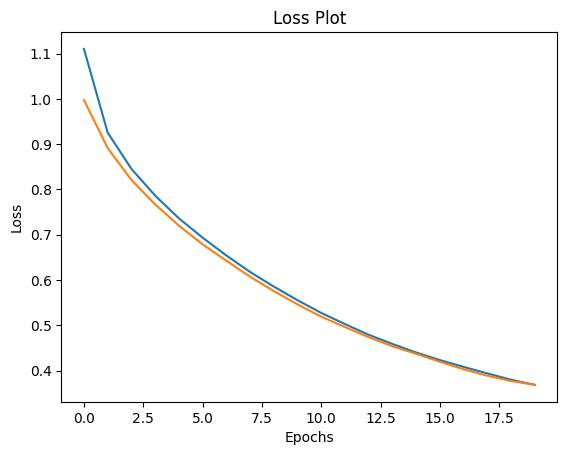

In [95]:
plt.plot(loss_plot)
plt.plot(test_loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

In [101]:
def evaluate(image):
    max_length=max_l
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.init_state(batch_size=1)

    temp_input = tf.expand_dims(load_the_image(image)[0], 0) #process the input image to desired format before extracting features
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.argmax(predictions[0]).numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot,predictions

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot,predictions

In [99]:
def beam_evaluate(image, beam_index = 3):
    max_length=max_l
    start = [tokenizer.word_index['<start>']]
    result = [[start, 0.0]]

    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.init_state(batch_size=1)

    temp_input = tf.expand_dims(load_the_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)

    while len(result[0][0]) < max_length:
        i=0
        temp = []
        for s in result:
            predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
            attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
            i=i+1
            word_preds = np.argsort(predictions[0])[-beam_index:]
          
            for w in word_preds:
                next_cap, prob = s[0][:], s[1]
                next_cap.append(w)
            
                prob += np.log(predictions[0][w])
                    
                temp.append([next_cap, prob])
        result = temp
        result = sorted(result, reverse=False, key=lambda l: l[1])
        result = result[-beam_index:]
        
        
        predicted_id = result[-1]
        pred_list = predicted_id[0]
        
        prd_id = pred_list[-1] 
        if(prd_id!=3):
            dec_input = tf.expand_dims([prd_id], 0)  
        else:
            break
    
    
    result2 = result[-1][0]
    
    intermediate_caption = [tokenizer.index_word[i] for i in result2]
    final_caption = []
    for i in intermediate_caption:
        if i != '<end>':
            final_caption.append(i)
            
        else:
            break

    attention_plot = attention_plot[:len(result), :]
    final_caption = ' '.join(final_caption[1:])
    return final_caption

In [107]:
def plot_attmap(caption, weights, image):

    fig = plt.figure(figsize=(10, 10))
    temp_img = np.array(Image.open(image))
    
    len_cap = len(caption)
    for cap in range(len_cap):
        weights_img = np.reshape(weights[cap], (8,8))
        weights_img = np.array(Image.fromarray(weights_img).resize((224, 224), Image.LANCZOS))
        
        ax = fig.add_subplot(len_cap//2, len_cap//2, cap+1)
        ax.set_title(caption[cap], fontsize=15)
        
        img=ax.imshow(temp_img)
        
        ax.imshow(weights_img, cmap='gist_heat', alpha=0.6,extent=img.get_extent())
        ax.axis('off')
    plt.subplots_adjust(hspace=0.2, wspace=0.2)
    plt.show()

In [105]:
def filt_text(text):
    filt=['<start>','<unk>','<end>'] 
    temp= text.split()
    [temp.remove(j) for k in filt for j in temp if k==j]
    text=' '.join(temp)
    return text

In [103]:
features_shape = batch_f.shape[1]
attention_features_shape = batch_f.shape[0]

7271
BLEU score: 100.0
Real Caption: oklahoma horse mascot in a sea of red fans
Prediction Caption: oklahoma horse mascot in a sea of red fans


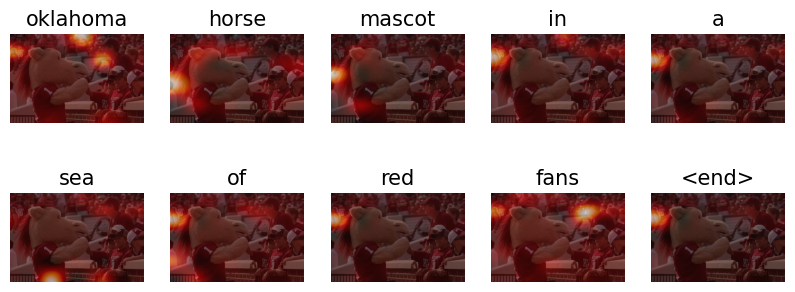

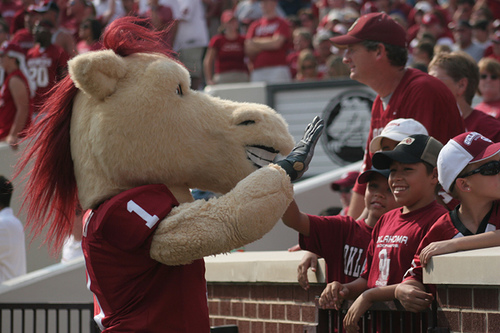

In [112]:
rid = np.random.randint(0, len(image_test))
print(rid)
test_image = image_test[rid]
#test_image = './images/413231421_43833a11f5.jpg'
#real_caption = '<start> black dog is digging in the snow <end>'

real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot,pred_test = evaluate(test_image)


real_caption=filt_text(real_caption)      


pred_caption=' '.join(result).rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = pred_caption.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BLEU score: {score*100}")

print('Real Caption:', real_caption)
print('Prediction Caption:', pred_caption)
plot_attmap(result, attention_plot, test_image)


Image.open(test_image)

1741
BLEU score: 29.97762379232956
Real Caption: a person is riding a unicycle on the street with many other people around
Prediction Caption: a person wearing black rides a unicycle down the street


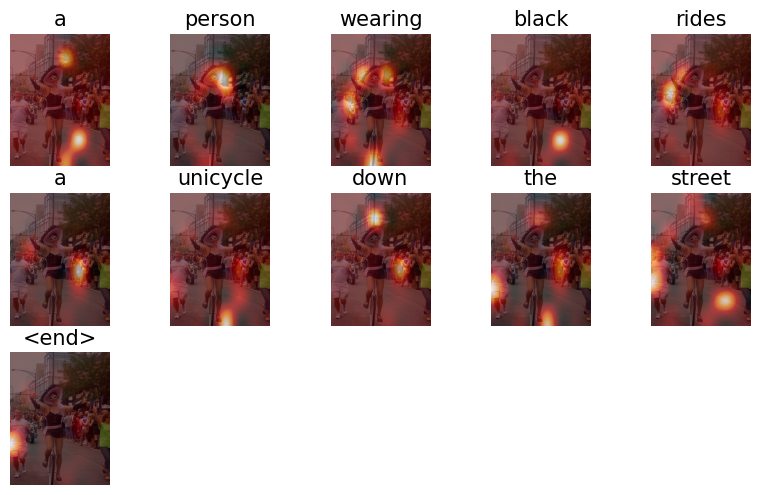

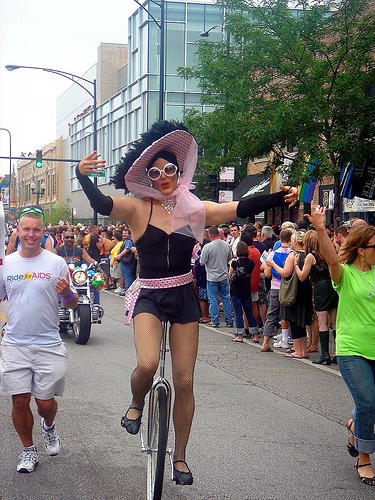

In [113]:
rid = np.random.randint(0, len(image_test))
print(rid)
test_image = image_test[rid]
#test_image = './images/413231421_43833a11f5.jpg'
#real_caption = '<start> black dog is digging in the snow <end>'

real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot,pred_test = evaluate(test_image)


real_caption=filt_text(real_caption)      


pred_caption=' '.join(result).rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = pred_caption.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BLEU score: {score*100}")

print('Real Caption:', real_caption)
print('Prediction Caption:', pred_caption)
plot_attmap(result, attention_plot, test_image)


Image.open(test_image)

1822


/opt/conda/lib/python3.10/site-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 4-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


BLEU score: 25.630598383971304
Real Caption: two little girls and one little boy are running on the grass
Prediction Caption: three little kids are playing on the grass


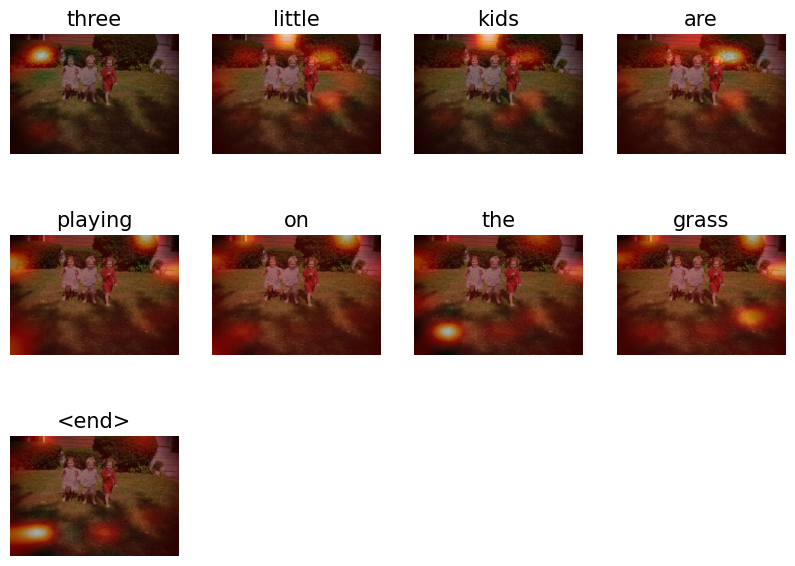

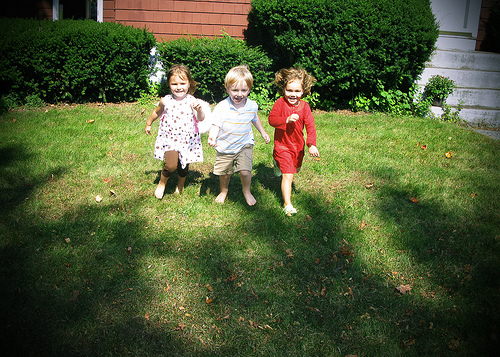

In [116]:
rid = np.random.randint(0, len(image_test))
print(rid)
test_image = image_test[rid]
#test_image = './images/413231421_43833a11f5.jpg'
#real_caption = '<start> black dog is digging in the snow <end>'

real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot,pred_test = evaluate(test_image)


real_caption=filt_text(real_caption)      


pred_caption=' '.join(result).rsplit(' ', 1)[0]

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = pred_caption.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BLEU score: {score*100}")

print('Real Caption:', real_caption)
print('Prediction Caption:', pred_caption)
plot_attmap(result, attention_plot, test_image)


Image.open(test_image)